# Cálculo de control con observación de estados para el péndulo invertido
Se emplea la medición del ángulo y del desplazamiento, y se logra el control con referencia no nula partiendo de $\pi$.

In [23]:
import numpy as np
import scipy as sp
import scipy.signal
from matplotlib import pyplot as plt
from pylab import *
from numpy.linalg import eig
import pandas as pd
import plotly.graph_objects as go
m=.1;Fricc=0.1; long=0.6;g=9.8;M=.5;



# Modelo linealizado del péndulo invertido en el punto de equilibrio inestable
# Referencia: Sontag, Mathematical Control Theory, p.104

# Vector de estado x = [p; p_dot; fi; fi_dot] donde:
#   p: posición del carro
#   p_dot: velocidad del carro  
#   fi: ángulo del péndulo
#   fi_dot: velocidad angular del péndulo

# Matriz A del sistema linealizado
Mat_A = np.array([
    [0.,      1.,          0.,     0.],
    [0., -Fricc/M,    -m*g/M,     0.],
    [0.,      0.,          0.,     1.],
    [0., Fricc/(long*M), g*(m+M)/(long*M), 0.]
])

# Vector B de entrada
Mat_B = np.array([
    [0.],
    [1/M],
    [0.],
    [-1./(long*M)]
])

# Matriz C de salida - Medición de posición y ángulo
Mat_C = np.array([
    [1., 0., 0., 0.],  # y1: posición del carro
    [0., 0., 1., 0.]   # y2: ángulo del péndulo
])

# Cálculo del controlador por asignación de polos

In [24]:
# Construcción del sistema ampliado para incluir el integrador
# Se agrega una fila y columna adicional para el estado del integrador
Mat_Aaa = np.block([[Mat_A, np.zeros((4,1))]])  # Agregar columna de ceros
Mat_Aa = np.block([[Mat_Aaa],                    # Agregar fila con -C y 0
                   [-Mat_C[0,:], 0]])            # Solo primera fila de C (posición)
Mat_Ba = np.block([[Mat_B],                      # Vector B ampliado
                   [0]])                         # Entrada al integrador

# Cálculo de la matriz de controlabilidad del sistema ampliado
Mat_Ma = np.block([
    Mat_Ba, 
    np.matmul(Mat_Aa, Mat_Ba),
    np.matmul(np.linalg.matrix_power(Mat_Aa,2), Mat_Ba),
    np.matmul(np.linalg.matrix_power(Mat_Aa,3), Mat_Ba),
    np.matmul(np.linalg.matrix_power(Mat_Aa,4), Mat_Ba)
])

# Obtener autovalores del sistema ampliado
auto_val, auto_vect = eig(Mat_Aa)

# Cálculo del polinomio característico del sistema ampliado
c_ai = np.poly(auto_val)

# Construcción de la matriz de Wonham
Mat_Wa = np.array([
    [c_ai[4], c_ai[3], c_ai[2], c_ai[1], c_ai[0]],
    [c_ai[3], c_ai[2], c_ai[1], c_ai[0], 0],
    [c_ai[2], c_ai[1], c_ai[0], 0, 0],
    [c_ai[1], c_ai[0], 0, 0, 0],
    [c_ai[0], 0, 0, 0, 0]
])

# Cálculo de la matriz de transformación
Mat_Ta = Mat_Ma @ Mat_Wa

# Verificación de controlabilidad
A_controlable = np.linalg.inv(Mat_Ta) @ Mat_Aa @ Mat_Ta

# Ubicación deseada de los polos en lazo cerrado
mui = np.array([
    -20.68665,
    -0.04927 + 0.09396j,
    -0.04927 - 0.09396j,
    -0.81299 + 0.83486j,
    -0.81299 - 0.83486j
])

# Cálculo de la ganancia del controlador
fi_ia = np.poly(mui)                # Polinomio característico deseado
re = (fi_ia - c_ai)                 # Diferencia entre polinomios
Ka = flip(re[1:]) @ np.linalg.inv(Mat_Ta)  # Ganancia del controlador

# Verificación de polos en lazo cerrado
auto_val_LC, auto_vect_LC = eig(Mat_Aa - Mat_Ba @ np.array([Ka]))
print("Polos de lazo cerrado del controlador:", auto_val_LC)

Polos de lazo cerrado del controlador: [-20.68665+0.j       -0.04927+0.09396j  -0.04927-0.09396j
  -0.81299+0.83486j  -0.81299-0.83486j]


In [25]:
A_controlable

array([[-1.68300747e-15,  1.00000000e+00, -1.68142302e-18,
         4.05948895e-19, -3.88899360e-20],
       [-2.85497255e-30,  1.17096541e-30,  1.00000000e+00,
        -5.39260384e-32,  4.05948895e-19],
       [-3.30402372e-14,  8.52651283e-15, -5.69374794e-17,
         1.00000000e+00,  1.16934282e-18],
       [-1.12830936e-28,  4.10207671e-29,  0.00000000e+00,
        -7.88860905e-31,  1.00000000e+00],
       [-6.47588649e-13,  1.68229874e-13,  3.26666667e+00,
         1.96000000e+01, -2.00000000e-01]])

## Cálculo del observador vía asignación de polos

se contruye el sistema DUAL con el sistema ORIGINAL, es decir, SIN AMPLIAR.

In [26]:
Mat_A_O=np.transpose(Mat_A)
h_=np.array([[-1],[1]])
Mat_B_O=np.transpose(Mat_C)@h_ #Mat_Bdual=Mat_C'*h_;

Se sigue el diseño como si fuera una asignación univariable.

In [27]:
# Construcción de la matriz de controlabilidad del sistema dual
Mat_M_Dual = np.block([
    Mat_B_O,  # B dual
    np.matmul(Mat_A_O, Mat_B_O),  # A*B dual
    np.matmul(np.linalg.matrix_power(Mat_A_O, 2), Mat_B_O),  # A^2*B dual
    np.matmul(np.linalg.matrix_power(Mat_A_O, 3), Mat_B_O)   # A^3*B dual
])

# Cálculo del polinomio característico del sistema original
auto_valA, auto_vectA = eig(Mat_A)
fi_ai = np.poly(auto_valA)

# Construcción de la matriz de transformación W para el observador
Mat_W_O = np.array([
    [fi_ai[3], fi_ai[2], fi_ai[1], fi_ai[0]],
    [fi_ai[2], fi_ai[1], fi_ai[0], 0],
    [fi_ai[1], fi_ai[0], 0, 0],
    [fi_ai[0], 0, 0, 0]
])

# Ubicación deseada de los polos del observador
# Se eligen polos más rápidos que los del controlador para mejor estimación
mui_o = np.array([
    -11.155498 + 29.555177j,  # Polo complejo conjugado 1
    -11.155498 - 29.555177j,  # Polo complejo conjugado 1
    -0.050094 + 0.025678j,    # Polo complejo conjugado 2
    -0.050094 - 0.025678j     # Polo complejo conjugado 2
])

# Cálculo del polinomio característico deseado para el observador
alfaO_i = np.poly(mui_o)

# Cálculo de la matriz de transformación T del observador
Mat_T_O = np.matmul(Mat_M_Dual, Mat_W_O)

# Cálculo de la ganancia del observador
re_o = (alfaO_i - fi_ai)
ko = np.vstack(np.matmul(flip(re_o[1:]), np.linalg.inv(Mat_T_O)))
Ko = np.transpose(h_ @ np.transpose(ko))

# Verificación de los polos en lazo cerrado del observador
auto_val_LCO, auto_vect_LCO = eig(Mat_A - Ko @ Mat_C)
print("Polos de lazo cerrado del observador en ", auto_val_LCO)

# Cálculo de la matriz A controlable del observador
A_controlable_ = np.matmul(np.matmul(np.linalg.inv(Mat_T_O), Mat_A_O), Mat_T_O)

Polos de lazo cerrado del observador en  [-11.155498+2.9555177e+01j -11.155498-2.9555177e+01j
  -0.050094+2.5678000e-02j  -0.050094-2.5678000e-02j]


In [28]:
Ko

array([[   4.38250613,   -4.38250613],
       [  91.49384201,  -91.49384201],
       [ -17.82867787,   17.82867787],
       [-923.85600716,  923.85600716]])

In [29]:
Ka

array([-9.67962569e-02, -1.07377957e+00, -1.70992675e+01, -7.30761874e+00,
        9.67947577e-03])

## Condiciones iniciales y simulación

In [30]:
# Parámetros de simulación
h = 1e-3  # Paso de tiempo
t_simul = 150.  # Tiempo total de simulación
N = int(t_simul/h)  # Número de pasos

# Inicialización de vectores de tiempo y estados
t = np.linspace(0, t_simul, N)  # Vector de tiempo
ref = 10.  # Referencia de posición

# Estados del sistema
fi = np.zeros(N)  # Ángulo del péndulo
omega = np.zeros(N)  # Velocidad angular
p = np.zeros(N)  # Posición del carro
p_p = np.zeros(N)  # Velocidad del carro

# Variables de control
u = np.zeros(N)  # Señal de control
psi = np.zeros(N)  # Error integral
y = np.zeros(N)  # Salida medida

# Variables del observador
y_o = np.zeros(N)  # Salida estimada
p_O = np.zeros(N)  # Posición estimada
fi_O = np.zeros(N)  # Ángulo estimado

# Condiciones iniciales
fi[0] = np.pi  # Ángulo inicial del péndulo
fi_pp = 0.  # Aceleración angular inicial

# Estado inicial real y estimado
estado = np.array([[p[0]], [p_p[0]], [fi[0]], [omega[0]]])  # Estado real
x_hat = np.zeros((4,1))  # Estado estimado

# Bucle principal de simulación
for ii in range(N-1):
    # Medición del sistema
    Y = Mat_C @ estado
    y[ii] = Y[0][0]
    
    # Cálculo del error y control integral
    psi_p = ref - y[ii]  # Error instantáneo
    psi[ii+1] = psi[ii] + psi_p*h  # Integración del error
    
    # Ley de control usando estados estimados
    u[ii] = -[Ka @ np.block([[x_hat],[psi[ii+1]]])][0][0]
    
    # Dinámica del sistema no lineal
    p_pp = (1/(M+m))*(u[ii] - m*long*fi_pp*cos(fi[ii]) + 
                      (m*long*omega[ii]**2)*sin(fi[ii]) - Fricc*p_p[ii])
    fi_pp = (1/long)*(g*sin(fi[ii]) - p_pp*cos(fi[ii]))
    
    # Actualización del observador
    Y_O = Mat_C @ x_hat
    y_o[ii] = Y_O[0][0]
    x_hatp = Mat_A @ x_hat + Mat_B*u[ii] + Ko@(Y-Y_O)
    x_hat = x_hat + h*x_hatp
    
    # Integración numérica de estados
    p_p[ii+1] = p_p[ii] + h*p_pp
    p[ii+1] = p[ii] + h*p_p[ii]
    omega[ii+1] = omega[ii] + h*fi_pp
    fi[ii+1] = fi[ii] + h*omega[ii]
    
    # Actualización del vector de estado real
    estado = np.array([[p[ii+1]], [p_p[ii+1]], [fi[ii+1]], [omega[ii+1]]])
    
    # Almacenamiento de estados estimados
    p_O[ii+1] = x_hat[0][0]
    fi_O[ii+1] = x_hat[2][0]

# Últimos valores
t[ii+1] = ii*h
u[ii+1] = -[Ka @ np.block([[x_hat],[psi[ii]]])][0][0]

# Estado final estimado
x_hat

array([[ 9.96829382e+00],
       [-1.36813691e-02],
       [-3.04604812e-04],
       [-1.73744687e-04]])

In [ ]:
!apt-get install dvipng texlive-latex-extra texlive-fonts-recommended cm-super

In [ ]:
!pip install SciencePlots # !pip install git+https://github.com/garrettj403/SciencePlots

In [31]:
import scienceplots

# Figuras

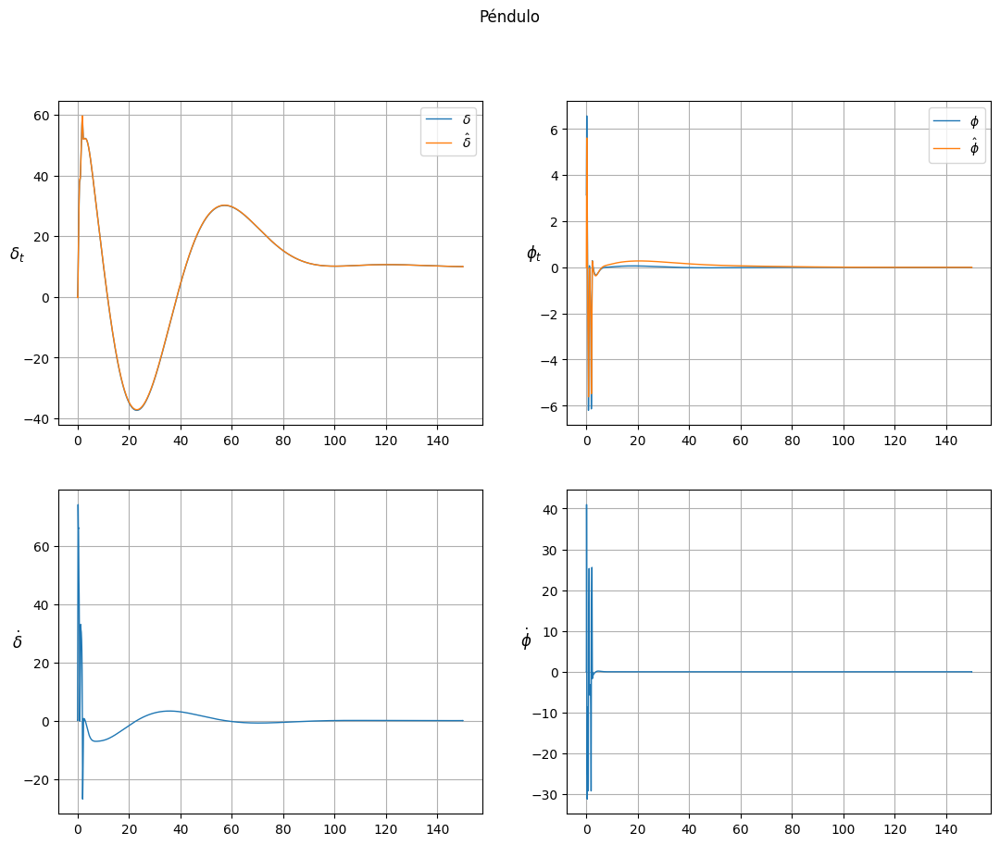

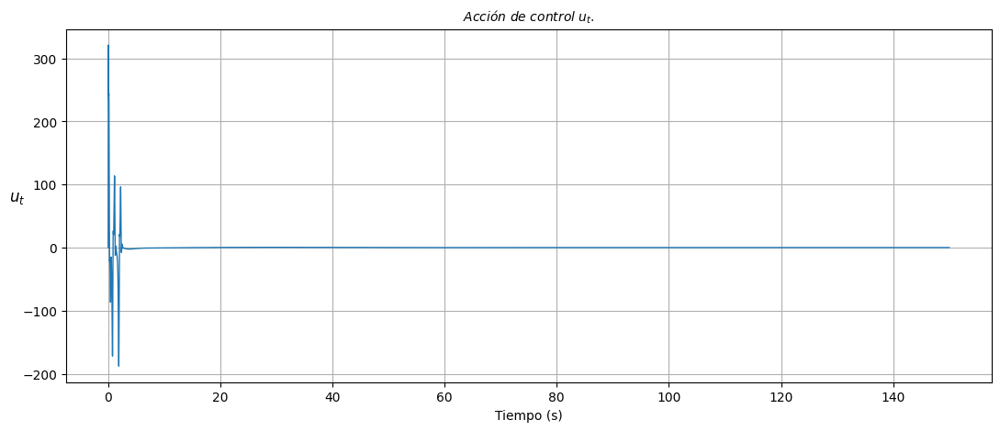

In [32]:
# with plt.style.context('ieee'):
# with plt.style.context('science'):
# with plt.style.context('dark_background'):
# with plt.style.context('seaborn-v0_8-pastel'):
# with plt.style.context('seaborn-v0_8-poster'):
fig, axs = plt.subplots(2,2,figsize=(13,10), dpi= 100) #fig, axs = plt.subplots(2,NA,figsize=(13,10), dpi= 100)
fig.suptitle(r'Péndulo')
axs[0,1].plot(t, fi, linewidth =1.0)
axs[0,1].plot(t, fi_O, linewidth =1.0)
axs[0,1].grid( True )
axs[0,1].set_ylabel(r'$\phi_t$',rotation=0, fontsize=12)
axs[0,1].legend([r"$\phi$",r"$\hat{\phi}$"])
axs[1,1].plot(t, omega, linewidth =1.0)
axs[1,1].set_ylabel(r'$\dot{\phi}$',rotation=0, fontsize=12)
axs[1,1].grid( True )
axs[0,0].plot(t, p, linewidth =1.0)
axs[0,0].plot(t, p_O, linewidth =1.0)
axs[0,0].grid( True )
axs[0,0].set_ylabel(r'$\delta_t$',rotation=0, fontsize=12)
axs[0,0].legend([r"$\delta$",r"$\hat{\delta}$"])
axs[1,0].plot(t, p_p, linewidth =1.0)
axs[1,0].set_ylabel(r'$\dot{\delta}$',rotation=0, fontsize=12)
axs[1,0].grid( True )
#Acción de control
figa, ax1 = plt.subplots(1,1,figsize=(13,5), dpi= 100) #fig, axs = plt.subplots(2,NA,figsize=(13,10), dpi= 100)
# fig, ax1 = plt.subplots()
plt.plot(t[:-1], u[:-1], linewidth =1.0)
plt.grid( True )
ax1.set_ylabel(r'$u_t$',rotation=0, fontsize=12)
ax1.set_xlabel(r'Tiempo (s)')
ax1.set_title(r'$Acción\ de\ control\ u_t.$', fontsize=10)
show()

Errores de observación de estados.

<>:7: SyntaxWarning:

invalid escape sequence '\ '

<>:9: SyntaxWarning:

invalid escape sequence '\ '

<>:7: SyntaxWarning:

invalid escape sequence '\ '

<>:9: SyntaxWarning:

invalid escape sequence '\ '

/tmp/ipykernel_298015/2778676351.py:7: SyntaxWarning:

invalid escape sequence '\ '

/tmp/ipykernel_298015/2778676351.py:9: SyntaxWarning:

invalid escape sequence '\ '



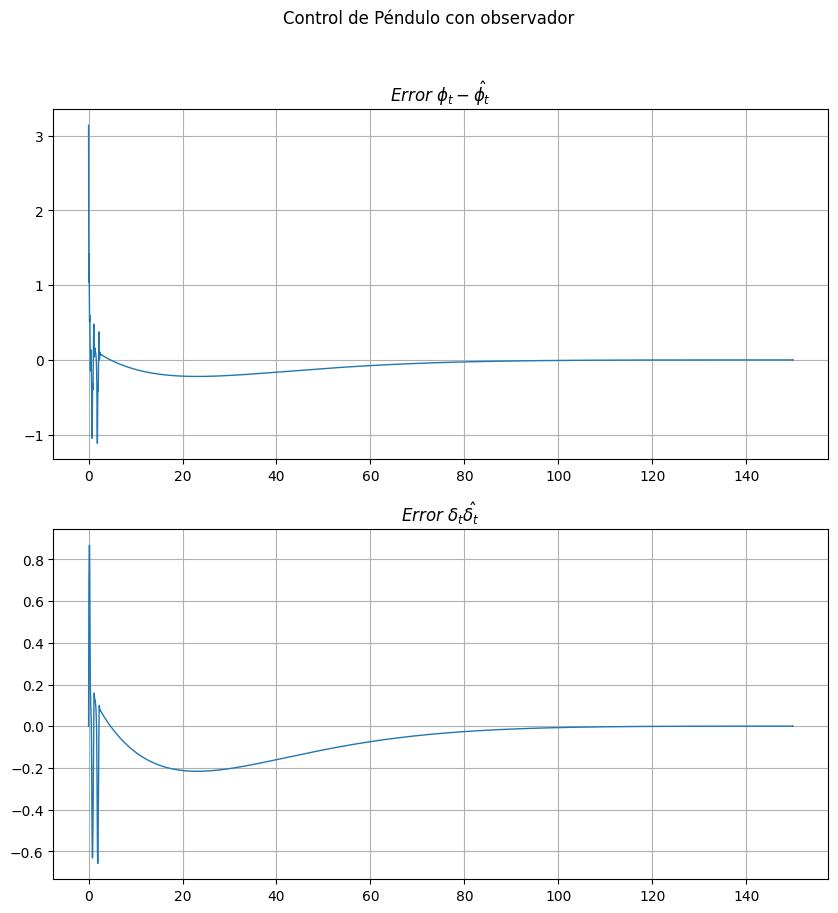

In [33]:
# with plt.style.context('ieee'):
fig2, axs2 = plt.subplots(2,1,figsize=(10,10), dpi= 100) #fig, axs = plt.subplots(2,NA,figsize=(13,10), dpi= 100)
##fig2, axs2 = plt.subplots(1,2)
fig2.suptitle('Control de Péndulo con observador')
axs2[0].plot(t, fi-fi_O, linewidth =1.0)
axs2[0].grid( True )
axs2[0].set_title('$Error\ \phi_t-\hat{\phi_t}$',rotation=0, fontsize=12)
axs2[1].plot(t, p-p_O, linewidth =1.0)
axs2[1].set_title('$Error\ \delta_t\hat{\delta_t}$',rotation=0, fontsize=12)
axs2[1].grid( True )

In [34]:
df = pd.DataFrame({'t': t, 'fi': fi, 'fi_O':fi_O, 'fi_p': omega, 'p': p, 'p_O': p_O, 'p_p': p_p, 'u': u})

In [35]:
df.tail(3)

,t,fi,fi_O,fi_p,p,p_O,p_p,u
149997,149.998,0.000163,-0.000305,-0.000003,9.968779,9.968321,-0.013733,-0.000416
149998,149.999,0.000163,-0.000305,-0.000003,9.968765,9.968308,-0.013732,-0.000415
149999,149.998,0.000163,-0.000305,-0.000003,9.968751,9.968294,-0.013730,-0.000415


In [36]:
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots

In [37]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
  go.Scatter(x=df['t'], y=df['p'], mode='lines', name=r'$\delta_t$'),
  row=1,col=1
  )
fig.add_trace(
  go.Scatter(x=df['t'], y=df['p_O'], mode='lines', name=r'$\hat{\delta_t}$'),
  row=1, col=1
  )
fig.add_trace(
  go.Scatter(x=df['t'], y=df['fi'], mode='lines', name=r'$\phi_t$'),
  row=1, col=2
)
fig.add_trace(
  go.Scatter(x=df['t'], y=df['fi_O'], mode='lines', name=r'$\hat{\phi_t}$'),
  row=1, col=2
)
fig.update_layout(height=600, width=1200, title_text="Variables del péndulo invertido")
fig.show()

fig = make_subplots(rows=1, cols=1)
fig.add_trace(
  go.Scatter(x=df['t'], y=df['u'], mode='lines', name=r'Acción de control'),
  row=1,col=1
  )